### Example for using LCDB 1.1 data

By: Cheng Yan, Tom Viering

In [31]:
import numpy as np
import h5py
import matplotlib.pyplot as plt
from scipy.stats import wilcoxon

In [32]:
# OpenML dataset ID
# This indicates which dataset is used
dataset_ids = [3, 6, 11, 12, 14, 15, 16, 18, 22, 23, 28, 29, 31, 32, 37, 38, 44, 46, 50, 54, 151, 182, 188, 300, 307, 458, 469, 554, 1049, 1050, 1053, 1063, 1067, 1068, 1461, 1462, 1464, 1468, 1475, 1478, 1480, 1485, 1486, 1487, 1489, 1494, 1497, 1501, 1510, 1590, 4134, 4534, 4538, 6332, 23381, 23517, 40499, 40668, 40670, 40701, 40923, 40927, 40966, 40975, 40978, 40979, 40982, 40983, 40984, 40994, 40996, 41027]

# anchor definition
# Anchor is a different term for the training set size 
anchor_list_denser = np.ceil(16 * 2 ** ((np.arange(137)) / 8)).astype(int)

# learners
# Different machine learning algorithms
learner_zoo = [ 'SVC_linear', 'SVC_poly', 'SVC_rbf', 'SVC_sigmoid', 'DecisionTree', 'ExtraTree','LogisticRegression', 'PassiveAggressive', 'Perceptron', 'RidgeClassifier', 'SGDClassifier', 'MLPClassifier', 'LDA', 'QDA', 'BernoulliNB', 'MultinomialNB', 'ComplementNB', 'GaussianNB','KNN', 'NearestCentroid', 'ens.ExtraTrees', 'ens.RandomForest', 'ens.GradientBoosting','DummyClassifier']

In [33]:
len(dataset_ids)

72

In [34]:
# load the error rate learning curves database 1.1
file_path = 'LCDB11_ER_CC18_noFS_real.hdf5'
with h5py.File(file_path, 'r') as hdf_file:
    dataset = hdf_file['error_rate'][...]
    print("Shape of dataset", dataset.shape)
    print("(dataset, learner, outer split, inner split, anchor, train-val-test)")

Shape of dataset (72, 24, 5, 5, 137, 3)
(dataset, learner, outer split, inner split, anchor, train-val-test)


### Visualization

Below we visualize a single learning curve, that is for a single train / validation / test split. 

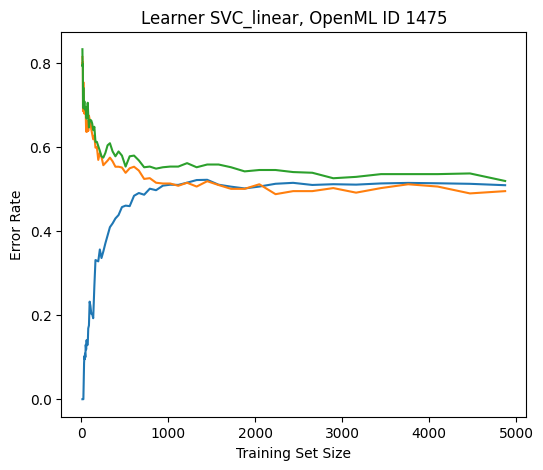

In [35]:
dataset_index = 38
learner_index = 0
outer_split = 0
inner_split = 0

plt.figure(figsize=(6, 5))
plt.plot(anchor_list_denser, dataset[dataset_index, learner_index, outer_split, inner_split,:, 0], label="Training")
plt.plot(anchor_list_denser, dataset[dataset_index, learner_index, outer_split, inner_split,:, 1], label="Validataion")
plt.plot(anchor_list_denser, dataset[dataset_index, learner_index, outer_split, inner_split,:, 2], label="Testing")
plt.title(f'Learner {learner_zoo[learner_index]}, OpenML ID {dataset_ids[dataset_index]}')
plt.xlabel('Training Set Size')
plt.ylabel('Error Rate')
plt.show()

Below we visualize the curve when we average over the different train / validation / test sets. We show the error rate on the validation set. The curve shows the mean learning curve, and the shaded area indicates the standard deviation over multiple train / val / test sets. 

C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1570183603.py:6: RuntimeWarning: Mean of empty slice
  mean_curve = np.nanmean(dataset[dataset_index, learner_index, :, :, :, train_val_test], axis=(0, 1))
C:\Users\DAN\AppData\Roaming\Python\Python39\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


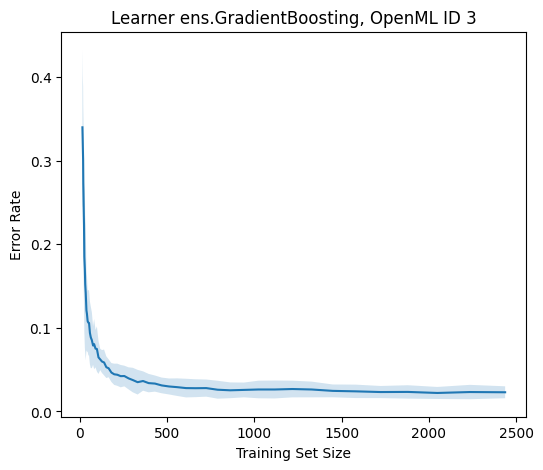

In [36]:
dataset_index = 0
learner_index = 22
train_val_test = 1 # validation

plt.figure(figsize=(6, 5))
mean_curve = np.nanmean(dataset[dataset_index, learner_index, :, :, :, train_val_test], axis=(0, 1))
std_curve = np.nanstd(dataset[dataset_index, learner_index, :, :, :, train_val_test], axis=(0, 1))
plt.plot(anchor_list_denser, mean_curve, label='LCDB 1.1')
plt.fill_between(anchor_list_denser, mean_curve - std_curve, mean_curve + std_curve, alpha=0.2)
plt.title(f'Learner {learner_zoo[learner_index]}, OpenML ID {dataset_ids[dataset_index]}')
plt.xlabel('Training Set Size')
plt.ylabel('Error Rate')
plt.show()

In [37]:

X = anchor_list_denser
Y = np.nanmean(dataset[dataset_index,learner_index,:,:,:,train_val_test],axis=(0,1))

C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\4086322827.py:2: RuntimeWarning: Mean of empty slice
  Y = np.nanmean(dataset[dataset_index,learner_index,:,:,:,train_val_test],axis=(0,1))


In [38]:
#Pipeline improved


[  16   18   20   21   23   25   27   30   32   35   39   42   46   50
   54   59   64   70   77   83   91   99  108  118  128  140  153  166
  182  198  216  235  256  280  305  332  363  395  431  470  512  559
  609  664  725  790  862  940 1024 1117 1218 1328 1449 1580 1723 1879
 2048 2234 2436]
59


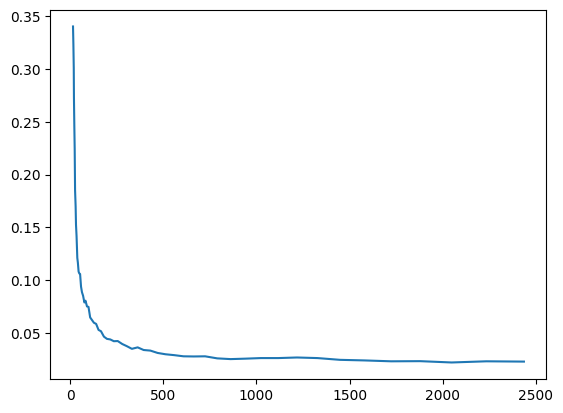

In [39]:
import matplotlib.pyplot as plt

mask = np.isnan(Y)
mask = np.logical_not(mask)

# remove the nan values
X = X[mask]
Y = Y[mask]
print(X)
plt.plot(X, Y)

print(len(X))


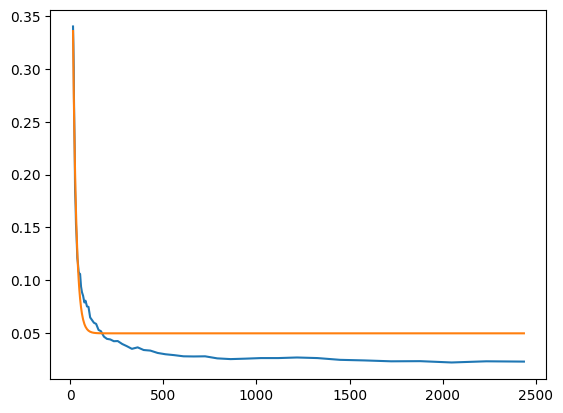

In [40]:
def exp3_function(x,a,b,c):
    return a*np.exp(-x*b)+c
plt.plot(X,Y)
plt.plot(X,exp3_function(X,0.71261205, 0.05703279, 0.04967656)) 

In [41]:
import numpy as np
import pandas as pd
from scipy.optimize import curve_fit
import random
import os
dataset_indexes=[0,1,2,3,4,5,6,7,8,9,10,17,18,20,21,23,37,38]
learner_indexes=[0,22]
def getDataSetAndLearnerImproved(learner_id,dataset_id,split_ratio):
    X=anchor_list_denser
    Y=np.nanmean(dataset[dataset_id,learner_id,:,:,:,train_val_test],axis=(0,1))
    mask = np.isnan(Y)
    mask = np.logical_not(mask)
    X=X[mask]
    Y=Y[mask]
    data=np.column_stack((X,Y))
    split_index=int(len(data)*split_ratio)
    fitting_data=data[:split_index]
    extrapolation_data=data[split_index:]
    return fitting_data,extrapolation_data
def initialize_uniform(bounds, size):
    return np.random.uniform(bounds[0], bounds[1], size)

# Function to initialize parameters with normal distribution
def initialize_normal(mean, std, size):
    return np.random.normal(mean, std, size)
def exp3_function(x,a,b,c):
    return a*np.exp(-x*b)+c
def pow2_function(x,a,b):
    return a*x**(-b)
def pow3_function(x,a,b,c):
    return a*x**(-b)+c
# Function to perform curve fitting and calculate MSE
def fit_and_evaluate(x_train, y_train, x_val, y_val, init_params, method='lm'):
    try:
        # Fit the model
        fitted_params, _ = curve_fit(model_function, x_train, y_train, p0=init_params, method=method)
        # Calculate MSE
        y_pred_val = exp3_function(x_val, *fitted_params)
        mse = np.mean((y_val - y_pred_val) ** 2)
        return fitted_params, mse
    except Exception as e:
        return None, np.inf  # Return infinity MSE if fitting fails

# Pipeline to process learners and datasets
def investigate_parameters(output_dir="results", num_iterations=10000):
    os.makedirs(output_dir, exist_ok=True)
    results = []

    for learner in learner_indexes:
        for  dataset in dataset_indexes:
            for i in range(num_iterations):
                # Split data
                train_data, val_data = getDataSetAndLearner(learner,dataset,0.8)
                x_train, y_train = train_data[:, 0], train_data[:, 1]
                x_val, y_val = val_data[:, 0], val_data[:, 1]

                # Initialize parameters with uniform and normal distributions
                uniform_params = initialize_uniform(bounds=(0, 1), size=3)
                normal_params = initialize_normal(mean=0, std=1, size=3)

                # Fit models and calculate MSE
                fitted_uniform, mse_uniform = fit_and_evaluate(
                    x_train, y_train, x_val, y_val, uniform_params)

                fitted_normal, mse_normal = fit_and_evaluate(
                    x_train, y_train, x_val, y_val, normal_params)

                # Save results
                results.append({
                    "learner": learner_name,
                    "dataset": dataset_name,
                    "iteration": i + 1,
                    "init_type": "uniform",
                    "mse": mse_uniform,
                    "params": fitted_uniform,
                })
                results.append({
                    "learner": learner_name,
                    "dataset": dataset_name,
                    "iteration": i + 1,
                    "init_type": "normal",
                    "mse": mse_normal,
                    "params": fitted_normal,
                })

    # Save results to a CSV
    results_df = pd.DataFrame(results)
    results_df["params"] = results_df["params"].apply(lambda x: x if x is not None else [])
    results_path = os.path.join(output_dir, "curve_fitting_results.csv")
    results_df.to_csv(results_path, index=False)
    print(f"Results saved to {results_path}")
'''
def visualize_mse_comparison(csv_file, output_dir="visualizations"):
    # Load results from CSV
    results_df = pd.read_csv(csv_file)

    # Ensure the output directory exists
    import os
    os.makedirs(output_dir, exist_ok=True)

    # Separate data by initialization type
    uniform_mse = results_df[results_df["init_type"] == "uniform"]["mse"].dropna()
    normal_mse = results_df[results_df["init_type"] == "normal"]["mse"].dropna()

    # Create a histogram for MSE comparison
    plt.figure(figsize=(10, 6))

    # Plot histograms with log scale on x-axis
    bins = np.logspace(np.log10(min(min(uniform_mse), min(normal_mse))),
                       np.log10(max(max(uniform_mse), max(normal_mse))), 50)

    plt.hist(uniform_mse, bins=bins, alpha=0.7, label="Uniform Initialization", color="blue")
    plt.hist(normal_mse, bins=bins, alpha=0.7, label="Normal Initialization", color="orange")

    # Configure log scale and labels
    plt.xscale("log")
    plt.xlabel("Mean Squared Error (log scale)")
    plt.ylabel("Frequency")
    plt.title("Comparison of MSE Distributions: Uniform vs Normal Initialization")
    plt.legend()
    plt.grid(True, which="both", linestyle="--", linewidth=0.5)

    # Save and show the plot
    output_path = os.path.join(output_dir, "mse_comparison_histogram.png")
    plt.savefig(output_path)
    plt.show()
    print(f"Visualization saved to {output_path}")
investigate_parameters(num_iterations=1000)  # Adjust iterations for testing
visualize_mse_comparison("results/curve_fitting_results.csv")
'''

'\ndef visualize_mse_comparison(csv_file, output_dir="visualizations"):\n    # Load results from CSV\n    results_df = pd.read_csv(csv_file)\n\n    # Ensure the output directory exists\n    import os\n    os.makedirs(output_dir, exist_ok=True)\n\n    # Separate data by initialization type\n    uniform_mse = results_df[results_df["init_type"] == "uniform"]["mse"].dropna()\n    normal_mse = results_df[results_df["init_type"] == "normal"]["mse"].dropna()\n\n    # Create a histogram for MSE comparison\n    plt.figure(figsize=(10, 6))\n\n    # Plot histograms with log scale on x-axis\n    bins = np.logspace(np.log10(min(min(uniform_mse), min(normal_mse))),\n                       np.log10(max(max(uniform_mse), max(normal_mse))), 50)\n\n    plt.hist(uniform_mse, bins=bins, alpha=0.7, label="Uniform Initialization", color="blue")\n    plt.hist(normal_mse, bins=bins, alpha=0.7, label="Normal Initialization", color="orange")\n\n    # Configure log scale and labels\n    plt.xscale("log")\n    pl

In [42]:
import pandas as pd
from scipy.optimize import curve_fit
import scipy.stats as stats
#auxiliary functions used for experiments
lower_bounds=[0,0,0]
upper_bounds=[np.inf,1,np.inf]
bounds=(lower_bounds,upper_bounds)
dataset_indexes=[0,3,10,17,18,20,21,23]
from sklearn.metrics import mean_squared_error
def function_for_datasets(datasetidx,learneridx,distribuion):
    fitting_data,extrap_data=getDataSetAndLearner(datasetidx,learneridx,0.8)
    params_init=[]
    params_coll=[]
    mse_interp_coll=[]
    mse_extrap_coll=[]
    mse_interp_initial=[]
    mse_extrap_initial=[]
    infodict=[]
    for i in range(2000):
        first_parameters_value,new_params_value,mse_interp,mse_extrap,mse_interp_i,mse_extrap_i,infodict1=getMSEForInterpandExtrap(fitting_data,extrap_data,distribuion)
        if mse_interp>0 and mse_interp<100 and mse_extrap>0 and mse_extrap<100:
            params_init.append(first_parameters_value)
            params_coll.append(new_params_value)
            mse_interp_coll.append(mse_interp)
            mse_extrap_coll.append(mse_extrap)
            if mse_interp_i>=0 and mse_extrap_i>=0:
                mse_interp_initial.append(mse_interp_i)
                mse_extrap_initial.append(mse_extrap_i)
            infodict.append(infodict1)
    saveValuesToFile(params_init,params_coll,mse_interp_coll,mse_extrap_coll,infodict,'rezultate Dataset'+str(datasetidx)+'Learner'+str(learneridx)+distribuion)
    return mse_interp_coll,mse_extrap_coll,mse_interp_initial,mse_extrap_initial,infodict
def function_for_datasets_improved(datasetidx,learneridx,distribuion):
    fitting_data,extrap_data=getDataSetAndLearner(datasetidx,learneridx,0.8)
    params_init=[]
    params_coll=[]
    mse_interp_coll=[]
    mse_extrap_coll=[]
    mse_interp_initial=[]
    mse_extrap_initial=[]
    infodict=[]
    for i in range(2000):
        first_parameters_value,new_params_value,mse_interp,mse_extrap,mse_interp_i,mse_extrap_i,infodict1=getMSEForInterpandExtrapImproved(fitting_data,extrap_data,distribuion)
        if mse_interp>0 and mse_interp<100 and mse_extrap>0 and mse_extrap<100:
            params_init.append(first_parameters_value)
            params_coll.append(new_params_value)
            mse_interp_coll.append(mse_interp)
            mse_extrap_coll.append(mse_extrap)
            if mse_interp_i>=0 and mse_extrap_i>=0:
                mse_interp_initial.append(mse_interp_i)
                mse_extrap_initial.append(mse_extrap_i)
            infodict.append(infodict1)
    saveValuesToFile(params_init,params_coll,mse_interp_coll,mse_extrap_coll,infodict,'rezultate Dataset'+str(datasetidx)+'Learner'+str(learneridx)+distribuion)
    return mse_interp_coll,mse_extrap_coll,mse_interp_initial,mse_extrap_initial,infodict
def exp3_function(x,a,b,c):
    return a*np.exp(-b*x)+c
def exp2_function(x,a,b):
    return a*np.exp(-b*x)
def pow3_function(x,a,b,c):
    return a*x**(-b)+c
def pow2_function(x,a,b):
    return a*x**(-b)
def exp4_function(x,a,b,c,f):
    return c-np.exp(-a*x**f+b)
def getDataSetAndLearner(learner_id,dataset_id,split_ratio):
    X=anchor_list_denser
    Y=np.nanmean(dataset[dataset_id,learner_id,:,:,:,train_val_test],axis=(0,1))
    mask = np.isnan(Y)
    mask = np.logical_not(mask)
    X=X[mask]
    Y=Y[mask]
    data=np.column_stack((X,Y))
    split_index=int(len(data)*split_ratio)
    fitting_data=data[:split_index]
    extrapolation_data=data[split_index:]
    return fitting_data,extrapolation_data
def getMSEForInterpandExtrapImproved(fitting_data,extrapolation_data,distribution):
    X_fit,Y_fit=fitting_data[:,0],fitting_data[:,1]
    X_validate,Y_validate=extrapolation_data[:,0],extrapolation_data[:,1]
    a,b,c=1,1,1
  # Use the same seed in both versions for fair comparison
    if distribution=='normal':
        a=np.random.normal(np.mean(Y_fit),np.std(Y_fit)/3)
        c=np.random.normal()
        values=[]
        for i in range(len(Y_fit)):
            values.append(-np.log(np.abs(Y_fit[i]-c)/a)/X_fit[i])
        b=np.random.normal(np.mean(values),np.std(values))
       # a=np.random.normal(50,16.66)
       # b=np.random.normal(50,16.66)
       # c=np.random.normal(50,16.66)
    elif distribution=='uniform':
        a=np.random.uniform(np.min(Y_fit),np.max(Y_fit))
        c=np.random.uniform()
        values=[]
        for i in range(len(Y_fit)):
            values.append(-np.log(np.abs(Y_fit[i]-c)/a)/X_fit[i])
        b=np.random.uniform(np.min(values),np.max(values))
      #  a=np.random.uniform(0,100)
       # b=np.random.uniform(0,100)
       # c=np.random.uniform(0,100)
    first_parameters_value=[a,b,c]
    initial_mse_interp=-1
    initial_mse_extrap=-1
    try:
        initial_mse_interp=mean_squared_error(Y_fit,exp3_function(X_fit,*first_parameters_value))
        initial_mse_extrap=mean_squared_error(Y_validate,exp3_function(Y_validate,*first_parameters_value))
    except(RuntimeError,ValueError):
        initial_mse_interp=-1
        initial_mse_extrap=-1
    try:
        popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
        new_params_collected=popt1
        mse_interp=mean_squared_error(Y_fit,exp3_function(X_fit,*popt1))
        mse_extrap=mean_squared_error(Y_validate,exp3_function(X_validate,*popt1))
        infodict=infodict1["nfev"]
        return first_parameters_value,new_params_collected,mse_interp,mse_extrap,initial_mse_interp,initial_mse_extrap,infodict
    except (RuntimeError,ValueError):
        return [-np.inf,-np.inf,-np.inf],[-np.inf,-np.inf,-np.inf],-1,-1,-1,-1,100
def getMSEForInterpandExtrap(fitting_data,extrapolation_data,distribution):
    X_fit,Y_fit=fitting_data[:,0],fitting_data[:,1]
    X_validate,Y_validate=extrapolation_data[:,0],extrapolation_data[:,1]
    a,b,c=1,1,1
  # Use the same seed in both versions for fair comparison
    if distribution=='normal':
        a=np.random.normal()
        b=np.random.normal()
        c=np.random.normal()
    elif distribution=='uniform':
        a=np.random.uniform(-3,3)
        b=np.random.uniform(-3,3)
        c=np.random.uniform(-3,3)
    first_parameters_value=[a,b,c]
    initial_mse_interp=-1
    initial_mse_extrap=-1
    try:
        initial_mse_interp=mean_squared_error(Y_fit,exp3_function(X_fit,*first_parameters_value))
        initial_mse_extrap=mean_squared_error(Y_validate,exp3_function(Y_validate,*first_parameters_value))
    except(RuntimeError,ValueError):
        initial_mse_interp=-1
        initial_mse_extrap=-1
    try:
        popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
        new_params_collected=popt1
        mse_interp=mean_squared_error(Y_fit,exp3_function(X_fit,*popt1))
        mse_extrap=mean_squared_error(Y_validate,exp3_function(X_validate,*popt1))
        infodict=infodict1["nfev"]
        return first_parameters_value,new_params_collected,mse_interp,mse_extrap,initial_mse_interp,initial_mse_extrap,infodict
    except (RuntimeError,ValueError):
        return [-np.inf,-np.inf,-np.inf],[-np.inf,-np.inf,-np.inf],-1,-1,-1,-1,100
def plotHistograms(mse_fit1, mse_fit2):
    plt.figure()
    bin_edges = np.histogram_bin_edges(np.concatenate([mse_fit1, mse_fit2]), bins=50)
    width = (bin_edges[1] - bin_edges[0]) / 3
    hist, bins, _ = plt.hist(np.concatenate([mse_fit1,mse_fit2]), bins=50)

# histogram on log scale.
# Use non-equal bin sizes, such that they look equal on log scale.
    logbins = np.logspace(np.log10(bins[1]),np.log10(bins[-1]),len(bins))
    # Plot first histogram with adjusted position
    plt.hist(mse_fit1, bins=logbins, color='yellow',
                    alpha=0.7, label=f'Fit2: {len(mse_fit1)} samples')

    # Plot second histogram with adjusted position
    plt.hist(mse_fit2, bins=logbins, color='blue',
                    alpha=0.7, label=f'Fit2: {len(mse_fit2)} samples')
    plt.title('Histogram to show interpolation and extrapolation')
    plt.xlabel('MSE values')
    plt.ylabel('Frequency (log scale)')
    plt.legend()
    plt.show()
def perform_mannwhitneyu_test(results1, results2, alternative='two-sided'):
    statistic, p_value = stats.mannwhitneyu(results1, results2, alternative=alternative)
    return statistic, p_value


def plotHistogramsInterpolation(mse_interp_uniform, mse_interp_normal):
    plt.figure(figsize=(8, 6))
    min_val = min(np.min(mse_interp_uniform), np.min(mse_interp_normal))
    max_val = max(np.max(mse_interp_uniform), np.max(mse_interp_normal))
    bins = np.logspace(np.log10(min_val), np.log10(max_val), 30)

    # Histogram for uniform
    plt.hist(mse_interp_uniform, bins=bins, alpha=0.7, color='blue', label='Uniform Distribution')

    # Histogram for normal
    plt.hist(mse_interp_normal, bins=bins, alpha=0.7, color='orange', label='Normal Distribution')

    plt.xscale('log')
    plt.title("Interpolation MSEs: Uniform vs Normal")
    plt.xlabel("MSE Values (Log Scale)")
    plt.ylabel("Frequency")
    plt.legend()
    plt.grid(alpha=0.5)
    plt.show()

def plotHistogramsExtrapolation(mse_extrap_uniform, mse_extrap_normal):
    plt.figure(figsize=(8, 6))
    min_val = min(np.min(mse_extrap_uniform), np.min(mse_extrap_normal))
    max_val = max(np.max(mse_extrap_uniform), np.max(mse_extrap_normal))
    bins = np.logspace(np.log10(min_val), np.log10(max_val), 30)

    # Histogram for uniform
    plt.hist(mse_extrap_uniform, bins=bins, alpha=0.7, color='blue', label='MSES before curve fitting')

    # Histogram for normal
    plt.hist(mse_extrap_normal, bins=bins, alpha=0.7, color='orange', label='MSES after curve fitting')

    plt.xscale('log')
    plt.title("Extrapolation MSEs: Initial guesses vs curve fitting")
    plt.xlabel("MSE Values (Log Scale)")
    plt.ylabel("Frequency")
    plt.legend()
    plt.grid(alpha=0.5)
    plt.show()
def saveValuesToFile(params,new_params,mseInterp,mseExtrap,infodict,fileName):
    data = {
    "Parameter_a": [param[0] for param in params],
    "Parameter_b": [param[1] for param in params],
    "New_param_a":[param[0] for param in new_params],
    "New_param_b":[param[1] for param in new_params],
    "MSE_Interpolation": mseInterp,
    "MSE_Extrapolation": mseExtrap,
    "InfoDict":infodict,
}
    df = pd.DataFrame(data)
    df = df.dropna()
    df.to_csv(fileName+'.csv',index=False)
    print("Data saved to "+fileName+".csv")
def generate_grouped_barcharts_without_seaborn(results, learners, datasets, distributions, save_path="plots/"):
    """
    Generate grouped bar charts for each dataset and learner across multiple distributions without seaborn.

    Parameters:
        results (dict): A dictionary where keys are datasets and values are another dictionary
                        with keys as learners and values as lists of results for each distribution.
        learners (list): List of learners.
        datasets (list): List of datasets.
        distributions (list): List of distributions (e.g., ['Uniform', 'Normal']).
        save_path (str): Directory to save the generated plots.

    Returns:
        None. Saves the plots in the specified directory.
    """
    # Ensure save_path exists
    import os
    if not os.path.exists(save_path):
        os.makedirs(save_path)

    # Iterate over each dataset
    for dataset in datasets:
        # Prepare data for plotting
        data = []
        for learner in learners:
            for i, dist in enumerate(distributions):
                data.append({
                    "Learner": learner,
                    "Distribution": dist,
                    "Interpolation MSE": results[dataset][learner]["interp"][i],
                    "Extrapolation MSE": results[dataset][learner]["extrap"][i]
                })

        # Convert to DataFrame
        df_interp = pd.DataFrame([{key: d[key] for key in d if key != "Extrapolation MSE"} for d in data])
        df_extrap = pd.DataFrame([{key: d[key] for key in d if key != "Interpolation MSE"} for d in data])

        # Plot interpolation
        plt.figure(figsize=(10, 6))
        bar_width = 0.35
        learners_positions = np.arange(len(learners))

        for i, dist in enumerate(distributions):
            y_vals = df_interp[df_interp["Distribution"] == dist]["Interpolation MSE"].values
            plt.bar(learners_positions + i * bar_width, y_vals, bar_width, label=dist)

        plt.title(f"Interpolation Results for {dataset}")
        plt.ylabel("MSE")
        plt.xlabel("Learners")
        plt.xticks(learners_positions + bar_width / 2, learners, rotation=45)
        plt.legend()
        plt.tight_layout()
        plt.savefig(f"{save_path}/{dataset}_interp_results.png")
        plt.close()

        # Plot extrapolation
        plt.figure(figsize=(10, 6))
        for i, dist in enumerate(distributions):
            y_vals = df_extrap[df_extrap["Distribution"] == dist]["Extrapolation MSE"].values
            plt.bar(learners_positions + i * bar_width, y_vals, bar_width, label=dist)

        plt.title(f"Extrapolation Results for {dataset}")
        plt.ylabel("MSE")
        plt.xlabel("Learners")
        plt.xticks(learners_positions + bar_width / 2, learners, rotation=45)
        plt.legend()
        plt.tight_layout()
        plt.savefig(f"{save_path}/{dataset}_extrap_results.png")
        plt.close()
import matplotlib.pyplot as plt
import numpy as np
def visualize_mse_per_dataset_and_learner_uniform_improved(results, learners, datasets):
    """
    Create a bar chart to visualize mean MSE values for uniform and normal distributions
    across all datasets and learners.

    Parameters:
        results (dict): Results dictionary containing mean MSE values.
        learners (list): List of learner names (e.g., ["Learner0", "Learner22"]).
        datasets (list): List of dataset names (e.g., ["Dataset0", "Dataset3"]).

    Returns:
        None. Displays the bar chart.
    """
    # Prepare data for the bar chart
    x_labels = []  # Labels for the x-axis (Dataset + Learner combinations)
    uniform_means = []  # Mean MSE values for uniform distribution
    normal_means = []   # Mean MSE values for normal distribution

    for dataset in datasets:
        for learner in learners:
            # Access the mean MSE values for the current dataset + learner
            if dataset in results and learner in results[dataset]:
                data = results[dataset][learner]
                # Collect mean MSEs for uniform and normal
                uniform_means.append(data["uniform"][0])  # Uniform interpolation MSE
                normal_means.append(data["uniform"][1])  # Normal interpolation MSE
                x_labels.append(f"{dataset} + {learner}")  # Create x-axis label

    # Plot the bar chart
    x = np.arange(len(x_labels))  # Positions for the bars on the x-axis
    bar_width = 0.4

    plt.figure(figsize=(12, 8))
    plt.bar(x - bar_width / 2, uniform_means, bar_width, label="Uniform before improvement", color="blue")
    plt.bar(x + bar_width / 2, normal_means, bar_width, label="Uniform after improvement with fitting data", color="orange")

    # Add labels and aesthetics
    plt.yscale('log')
    plt.xlabel("Dataset + Learner", fontsize=12)
    plt.ylabel("Mean MSE (0 to 1)", fontsize=12)
    plt.title("Mean MSE for Uniform vs Uniform with improvement (Extrapolation)", fontsize=14)
    plt.xticks(x, x_labels, rotation=45, ha="right", fontsize=10)
    plt.ylim(0, 1)  # Ensure the y-axis is limited to 0 to 1
    plt.legend()
    plt.tight_layout()
    plt.grid(axis="y", alpha=0.5)
    plt.show()
def visualize_mse_per_dataset_and_learner_normal_improved(results, learners, datasets):
    """
    Create a bar chart to visualize mean MSE values for uniform and normal distributions
    across all datasets and learners.

    Parameters:
        results (dict): Results dictionary containing mean MSE values.
        learners (list): List of learner names (e.g., ["Learner0", "Learner22"]).
        datasets (list): List of dataset names (e.g., ["Dataset0", "Dataset3"]).

    Returns:
        None. Displays the bar chart.
    """
    # Prepare data for the bar chart
    x_labels = []  # Labels for the x-axis (Dataset + Learner combinations)
    uniform_means = []  # Mean MSE values for uniform distribution
    normal_means = []   # Mean MSE values for normal distribution

    for dataset in datasets:
        for learner in learners:
            # Access the mean MSE values for the current dataset + learner
            if dataset in results and learner in results[dataset]:
                data = results[dataset][learner]
                # Collect mean MSEs for uniform and normal
                uniform_means.append(data["normal"][0])  # Uniform interpolation MSE
                normal_means.append(data["normal"][1])  # Normal interpolation MSE
                x_labels.append(f"{dataset} + {learner}")  # Create x-axis label

    # Plot the bar chart
    x = np.arange(len(x_labels))  # Positions for the bars on the x-axis
    bar_width = 0.4

    plt.figure(figsize=(12, 8))
    plt.bar(x - bar_width / 2, uniform_means, bar_width, label="Normal MSES before improvement", color="blue")
    plt.bar(x + bar_width / 2, normal_means, bar_width, label="Normal MSES after improvement with fitting data", color="orange")

    # Add labels and aesthetics
    plt.yscale('log')
    plt.xlabel("Dataset + Learner", fontsize=12)
    plt.ylabel("Mean MSE (0 to 1)", fontsize=12)
    plt.title("Mean MSE for Normall vs Normal with improvement (Extrapolation)", fontsize=14)
    plt.xticks(x, x_labels, rotation=45, ha="right", fontsize=10)
    plt.ylim(0, 1)  # Ensure the y-axis is limited to 0 to 1
    plt.legend()
    plt.tight_layout()
    plt.grid(axis="y", alpha=0.5)
    plt.show()
def visualize_mse_per_dataset_and_learner(results, learners, datasets):
    """
    Create a bar chart to visualize mean MSE values for uniform and normal distributions
    across all datasets and learners.

    Parameters:
        results (dict): Results dictionary containing mean MSE values.
        learners (list): List of learner names (e.g., ["Learner0", "Learner22"]).
        datasets (list): List of dataset names (e.g., ["Dataset0", "Dataset3"]).

    Returns:
        None. Displays the bar chart.
    """
    # Prepare data for the bar chart
    x_labels = []  # Labels for the x-axis (Dataset + Learner combinations)
    uniform_means = []  # Mean MSE values for uniform distribution
    normal_means = []   # Mean MSE values for normal distribution

    for dataset in datasets:
        for learner in learners:
            # Access the mean MSE values for the current dataset + learner
            if dataset in results and learner in results[dataset]:
                data = results[dataset][learner]
                # Collect mean MSEs for uniform and normal
                uniform_means.append(data["interp"][0])  # Uniform interpolation MSE
                normal_means.append(data["interp"][1])  # Normal interpolation MSE
                x_labels.append(f"{dataset} + {learner}")  # Create x-axis label

    # Plot the bar chart
    x = np.arange(len(x_labels))  # Positions for the bars on the x-axis
    bar_width = 0.4

    plt.figure(figsize=(12, 8))
    plt.bar(x - bar_width / 2, uniform_means, bar_width, label="Uniform", color="blue")
    plt.bar(x + bar_width / 2, normal_means, bar_width, label="Normal", color="orange")

    # Add labels and aesthetics
    plt.yscale('log')
    plt.xlabel("Dataset + Learner", fontsize=12)
    plt.ylabel("Mean MSE (0 to 1)", fontsize=12)
    plt.title("Mean MSE for Uniform vs Normal Distributions (Interpolation)", fontsize=14)
    plt.xticks(x, x_labels, rotation=45, ha="right", fontsize=10)
    plt.ylim(0, 1)  # Ensure the y-axis is limited to 0 to 1
    plt.legend()
    plt.tight_layout()
    plt.grid(axis="y", alpha=0.5)
    plt.show()

# Call the function

def visualize_mse_per_dataset_and_learnerE(results, learners, datasets):
    """
    Create a bar chart to visualize mean MSE values for uniform and normal distributions
    across all datasets and learners.

    Parameters:
        results (dict): Results dictionary containing mean MSE values.
        learners (list): List of learner names (e.g., ["Learner0", "Learner22"]).
        datasets (list): List of dataset names (e.g., ["Dataset0", "Dataset3"]).

    Returns:
        None. Displays the bar chart.
    """
    # Prepare data for the bar chart
    x_labels = []  # Labels for the x-axis (Dataset + Learner combinations)
    uniform_means = []  # Mean MSE values for uniform distribution
    normal_means = []   # Mean MSE values for normal distribution

    for dataset in datasets:
        for learner in learners:
            # Access the mean MSE values for the current dataset + learner
            if dataset in results and learner in results[dataset]:
                data = results[dataset][learner]
                # Collect mean MSEs for uniform and normal
                uniform_means.append(data["extrap"][0])  # Uniform interpolation MSE
                normal_means.append(data["extrap"][1])  # Normal interpolation MSE
                x_labels.append(f"{dataset} + {learner}")  # Create x-axis label

    # Plot the bar chart
    x = np.arange(len(x_labels))  # Positions for the bars on the x-axis
    bar_width = 0.4

    plt.figure(figsize=(12, 8))
    plt.bar(x - bar_width / 2, uniform_means, bar_width, label="Uniform", color="blue")
    plt.bar(x + bar_width / 2, normal_means, bar_width, label="Normal", color="orange")

    # Add labels and aesthetics
    plt.yscale('log')
    plt.xlabel("Dataset + Learner", fontsize=12)
    plt.ylabel("Mean MSE (0 to 1)", fontsize=12)
    plt.title("Mean MSE for Uniform vs Normal Distributions (Extrapolation)", fontsize=14)
    plt.xticks(x, x_labels, rotation=45, ha="right", fontsize=10)
    plt.ylim(0, 1)  # Ensure the y-axis is limited to 0 to 1
    plt.legend()
    plt.tight_layout()
    plt.grid(axis="y", alpha=0.5)
    plt.show()


In [ ]:
learner_indexes=[0,22]
results = {}
results1 ={}
p_values_e_u_normal=[]
failed_fits_normal=[]
failed_fits_uniform=[]
failed_fits_uniform_improved=[]
failed_fits_normal_improved=[]
p_values_extrapolation=[]
k=0
infodicts_u_improved=[]
infodicts_u_normal=[]
for i in dataset_indexes:
    dataset_name = f"Dataset{i}"
    results[dataset_name] = {}
    results1[dataset_name]={}
    for j in learner_indexes:
        learner_name = f"Learner{j}"
        mse_interp_normal,mse_extrap_normal,mse_interp_i_n,mse_extrap_i_n,infodict_n=function_for_datasets(i,j,'normal')
        mse_interp_uniform,mse_extrap_uniform,mse_interp_i_u,mse_extrap_i_u,infodict_u=function_for_datasets(i,j,'uniform')
        mse_interp_normal_improved,mse_extrap_normal_improved,mse_interp_i_n_improved,mse_extrap_i_n_improved,infodict_n_improved=function_for_datasets_improved(i,j,'normal')
        mse_interp_uniform_improved,mse_extrap_uniform_improved,mse_interp_i_u_improved,mse_extrap_i_u_improved,infodict_u_improved=function_for_datasets_improved(i,j,'uniform')
        failed_fits_normal.append(2000-len(mse_interp_i_n))
        failed_fits_uniform.append(2000-len(mse_interp_i_u))
        failed_fits_uniform_improved.append(2000-len(mse_interp_uniform_improved))
        failed_fits_normal_improved.append(2000-len(mse_interp_normal_improved))
        statistic_i,p_value_i=perform_mannwhitneyu_test(mse_interp_normal,mse_interp_uniform)
        infodicts_u_normal.append(np.mean(infodict_u))
        infodicts_u_improved.append(np.mean(infodict_u_improved))
        statistic_e,p_value_e=perform_mannwhitneyu_test(mse_extrap_uniform,mse_extrap_normal)
        p_values_extrapolation.append(p_value_e)
        if p_value_e<=0.05:
            k=k+1
        if p_value_e<=0.05:
            results[dataset_name][learner_name] = {
                "interp": [np.mean(mse_interp_uniform), np.mean(mse_interp_normal)],
                "extrap": [np.mean(mse_extrap_uniform), np.mean(mse_extrap_normal)]
            }
        statistic_e_improved_u,p_value_e_improved_u=perform_mannwhitneyu_test(mse_extrap_uniform_improved,mse_extrap_i_u)
        statistic_e_improved_n,p_value_e_improved_n=perform_mannwhitneyu_test(mse_extrap_normal_improved,mse_extrap_i_n)

        if p_value_e_improved_u<=0.05 and p_value_e_improved_n<=0.05:
            results1[dataset_name][learner_name]= {
                "uniform":[np.mean(mse_extrap_uniform),np.mean(mse_extrap_uniform_improved)],
                "normal":[np.mean(mse_extrap_normal),np.mean(mse_extrap_normal_improved)]
            }
print(np.mean(infodicts_u_normal))
print(np.mean(infodicts_u_improved))
print(np.mean(failed_fits_uniform))
print(np.mean(failed_fits_normal))
learners = [f"Learner{idx}" for idx in learner_indexes]
datasets = [f"Dataset{idx}" for idx in dataset_indexes]
distributions = ["Uniform", "Normal"]
visualize_mse_per_dataset_and_learner(results, learners, datasets)
visualize_mse_per_dataset_and_learnerE(results, learners, datasets)
visualize_mse_per_dataset_and_learner_uniform_improved(results1,learners,datasets)
visualize_mse_per_dataset_and_learner_normal_improved(results1,learners,datasets)

C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:66: RuntimeWarning: Mean of empty slice
  Y=np.nanmean(dataset[dataset_id,learner_id,:,:,:,train_val_test],axis=(0,1))
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:142: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:142: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:142: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodic

Data saved to rezultate Dataset0Learner0normal.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:66: RuntimeWarning: Mean of empty slice
  Y=np.nanmean(dataset[dataset_id,learner_id,:,:,:,train_val_test],axis=(0,1))
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:142: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Roaming\Python\Python39\site-packages\scipy\optimize\_minpack_py.py:1003: RuntimeWarning: overflow encountered in square
  cost = np.sum(infodict['fvec'] ** 2)
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:142: OptimizeWarning: Covariance of the p

Data saved to rezultate Dataset0Learner0uniform.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:66: RuntimeWarning: Mean of empty slice
  Y=np.nanmean(dataset[dataset_id,learner_id,:,:,:,train_val_test],axis=(0,1))
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:111: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:111: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:111: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodic

Data saved to rezultate Dataset0Learner0normal.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:66: RuntimeWarning: Mean of empty slice
  Y=np.nanmean(dataset[dataset_id,learner_id,:,:,:,train_val_test],axis=(0,1))
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\

Data saved to rezultate Dataset0Learner0uniform.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:66: RuntimeWarning: Mean of empty slice
  Y=np.nanmean(dataset[dataset_id,learner_id,:,:,:,train_val_test],axis=(0,1))
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:142: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:142: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\AppData\

Data saved to rezultate Dataset0Learner22normal.csv


C:\Users\DAN\AppData\Roaming\Python\Python39\site-packages\scipy\optimize\_minpack_py.py:1003: RuntimeWarning: overflow encountered in square
  cost = np.sum(infodict['fvec'] ** 2)
C:\Users\DAN\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:338: RuntimeWarning: overflow encountered in square
  output_errors = np.average((y_true - y_pred) ** 2, axis=0,
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:338: RuntimeWarning: overflow encountered in square
  output_errors = np.average((y_true - y_pred) ** 2, axis=0,
C:\Users\DAN\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:338: RuntimeWarning: overflow encountered in square
  output_errors = np.average((y_true - y_pred) ** 2, axis=0,
C:\Users\DAN\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:338: RuntimeWarning: overflow encountered in square
  ou

Data saved to rezultate Dataset0Learner22uniform.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:66: RuntimeWarning: Mean of empty slice
  Y=np.nanmean(dataset[dataset_id,learner_id,:,:,:,train_val_test],axis=(0,1))


Data saved to rezultate Dataset0Learner22normal.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:66: RuntimeWarning: Mean of empty slice
  Y=np.nanmean(dataset[dataset_id,learner_id,:,:,:,train_val_test],axis=(0,1))
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:111: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:111: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:111: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\AppData\Local\Tem

Data saved to rezultate Dataset0Learner22uniform.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:66: RuntimeWarning: Mean of empty slice
  Y=np.nanmean(dataset[dataset_id,learner_id,:,:,:,train_val_test],axis=(0,1))
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:142: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:142: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\AppData\

Data saved to rezultate Dataset3Learner0normal.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:142: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:142: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Roaming\Python\Python39\site-packages\scipy\optimize\_minpack_py.py:1003: RuntimeWarning: overflow encountered in square
  cost = np.sum(infodict['fvec'] ** 2)
C:\Users\DAN\AppData\

Data saved to rezultate Dataset3Learner0uniform.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in multiply
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:111: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fi

Data saved to rezultate Dataset3Learner0normal.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:66: RuntimeWarning: Mean of empty slice
  Y=np.nanmean(dataset[dataset_id,learner_id,:,:,:,train_val_test],axis=(0,1))
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in multiply
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+

Data saved to rezultate Dataset3Learner0uniform.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:66: RuntimeWarning: Mean of empty slice
  Y=np.nanmean(dataset[dataset_id,learner_id,:,:,:,train_val_test],axis=(0,1))
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:142: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:142: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\AppData\

Data saved to rezultate Dataset3Learner22normal.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Roaming\Python\Python39\site-packages\scipy\optimize\_minpack_py.py:1003: RuntimeWarning: overflow encountered in square
  cost = np.sum(infodict['fvec'] ** 2)
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:142: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:338: RuntimeWarning: overflow encountered in square
  output_errors = np.average((y_true - y_pred) ** 2, axis=0,
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encounte

Data saved to rezultate Dataset3Learner22uniform.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:66: RuntimeWarning: Mean of empty slice
  Y=np.nanmean(dataset[dataset_id,learner_id,:,:,:,train_val_test],axis=(0,1))


Data saved to rezultate Dataset3Learner22normal.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:66: RuntimeWarning: Mean of empty slice
  Y=np.nanmean(dataset[dataset_id,learner_id,:,:,:,train_val_test],axis=(0,1))
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c


Data saved to rezultate Dataset3Learner22uniform.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:66: RuntimeWarning: Mean of empty slice
  Y=np.nanmean(dataset[dataset_id,learner_id,:,:,:,train_val_test],axis=(0,1))
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:142: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Roaming\Python\Python39\site-packages\scipy\optimize\_minpack_py.py:1003: RuntimeWarning: overflow encountered in square
  cost = np.sum(infodict['fvec'] ** 2)
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:142: OptimizeWarning: Covariance of the p

Data saved to rezultate Dataset10Learner0normal.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Roaming\Python\Python39\site-packages\scipy\optimize\_minpack_py.py:1003: RuntimeWarning: overflow encountered in square
  cost = np.sum(infodict['fvec'] ** 2)
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:142: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Roaming\Python\Python39\site-packages\scipy\optimize\_minpack_py.py:1003: RuntimeWarning: overflow encountered in square
  cost

Data saved to rezultate Dataset10Learner0uniform.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:111: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:338: RuntimeWarning: overflow encountered in square
  output_errors = np.average((y_true - y_pred) ** 2, axis=0,
C:\Users\DAN\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:338: RuntimeWarning: overflow encountered in square
  output_errors = np.average((y_true - y_pred) ** 2, axis=0,
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:338: RuntimeWarning: overflow encountered in square
  output_errors = np.average((y_true - y_pred) ** 2, axis=0,


Data saved to rezultate Dataset10Learner0normal.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:66: RuntimeWarning: Mean of empty slice
  Y=np.nanmean(dataset[dataset_id,learner_id,:,:,:,train_val_test],axis=(0,1))
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\

Data saved to rezultate Dataset10Learner0uniform.csv


C:\Users\DAN\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:338: RuntimeWarning: overflow encountered in square
  output_errors = np.average((y_true - y_pred) ** 2, axis=0,
C:\Users\DAN\AppData\Roaming\Python\Python39\site-packages\scipy\optimize\_minpack_py.py:1003: RuntimeWarning: overflow encountered in square
  cost = np.sum(infodict['fvec'] ** 2)
C:\Users\DAN\AppData\Roaming\Python\Python39\site-packages\scipy\optimize\_minpack_py.py:1041: RuntimeWarning: invalid value encountered in multiply
  pcov = pcov * s_sq
C:\Users\DAN\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:338: RuntimeWarning: overflow encountered in square
  output_errors = np.average((y_true - y_pred) ** 2, axis=0,
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\User

Data saved to rezultate Dataset10Learner22normal.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:142: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Roaming\Python\Python39\site-packages\scipy\optimize\_minpack_py.py:1003: RuntimeWarning: overflow encountered in square
  cost = np.sum(infodict['fvec'] ** 2)
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:142: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\anaconda

Data saved to rezultate Dataset10Learner22uniform.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:66: RuntimeWarning: Mean of empty slice
  Y=np.nanmean(dataset[dataset_id,learner_id,:,:,:,train_val_test],axis=(0,1))


Data saved to rezultate Dataset10Learner22normal.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:66: RuntimeWarning: Mean of empty slice
  Y=np.nanmean(dataset[dataset_id,learner_id,:,:,:,train_val_test],axis=(0,1))
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\

Data saved to rezultate Dataset10Learner22uniform.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:66: RuntimeWarning: Mean of empty slice
  Y=np.nanmean(dataset[dataset_id,learner_id,:,:,:,train_val_test],axis=(0,1))
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:142: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Roaming\Python\Python39\site-packages\scipy\optimize\_minpack_py.py:1003: RuntimeWarning: overflow encountered in square
  cost

Data saved to rezultate Dataset17Learner0normal.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:142: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Roaming\Python\Python39\site-packages\scipy\optimize\_minpack_py.py:1003: RuntimeWarning: overflow encountered in square
  cost = np.sum(infodict['fvec'] ** 2)
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:142: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\anaconda

Data saved to rezultate Dataset17Learner0uniform.csv
Data saved to rezultate Dataset17Learner0normal.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:66: RuntimeWarning: Mean of empty slice
  Y=np.nanmean(dataset[dataset_id,learner_id,:,:,:,train_val_test],axis=(0,1))
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c


Data saved to rezultate Dataset17Learner0uniform.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:66: RuntimeWarning: Mean of empty slice
  Y=np.nanmean(dataset[dataset_id,learner_id,:,:,:,train_val_test],axis=(0,1))
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in multiply
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:142: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:142: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\ana

Data saved to rezultate Dataset17Learner22normal.csv


C:\Users\DAN\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:338: RuntimeWarning: overflow encountered in square
  output_errors = np.average((y_true - y_pred) ** 2, axis=0,
C:\Users\DAN\AppData\Roaming\Python\Python39\site-packages\scipy\optimize\_minpack_py.py:1003: RuntimeWarning: overflow encountered in square
  cost = np.sum(infodict['fvec'] ** 2)
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:142: OptimizeWarning: Covariance of the parameters could not be estimated
  popt1,pcov1,infodict1,mesg1,ier1=curve_fit(exp3_function,X_fit,Y_fit,p0=first_parameters_value,method="lm",full_output=True)
C:\Users\DAN\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:338: RuntimeWarning: overflow encountered in square
  output_errors = np.average((y_true - y_pred) ** 2, axis=0,
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\19

Data saved to rezultate Dataset17Learner22uniform.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:66: RuntimeWarning: Mean of empty slice
  Y=np.nanmean(dataset[dataset_id,learner_id,:,:,:,train_val_test],axis=(0,1))


Data saved to rezultate Dataset17Learner22normal.csv


C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:66: RuntimeWarning: Mean of empty slice
  Y=np.nanmean(dataset[dataset_id,learner_id,:,:,:,train_val_test],axis=(0,1))
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c
C:\Users\DAN\AppData\Local\Temp\ipykernel_12956\1931907331.py:55: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-b*x)+c


In [ ]:
dataset_index=0
learner_index=0
validation_error_rates = dataset[dataset_index, learner_index, outer_split, inner_split,:, 1]
first_non_nan_index = np.where(~np.isnan(validation_error_rates))[0][0] if np.any(~np.isnan(validation_error_rates)) else -1
last_non_nan_index = np.where(~np.isnan(validation_error_rates))[0][-1] if np.any(~np.isnan(validation_error_rates)) else -1
resized_validation_error_rates = validation_error_rates[first_non_nan_index:last_non_nan_index + 1]
resized_anchor_list_denser = anchor_list_denser[first_non_nan_index:last_non_nan_index + 1]
POINTS_TO_FIT_PCT = 0.8
POINTS_TO_FIT = int(POINTS_TO_FIT_PCT * len(resized_anchor_list_denser))
MODEL=exp3_function
mses=[]
for i in range(30000):
    a=np.random.uniform(min(resized_validation_error_rates),max(resized_validation_error_rates))
    c=np.random.uniform(0,1)
    b=(np.log(np.abs(np.mean(resized_validation_error_rates)-c))-np.log(a))/np.mean(resized_anchor_list_denser)
    initial_guess_original=[a,b,c]
    try:
    # Use curve_fit with improved initial guesses and bounds (if applicable)
        opt_params_original, covariance_matrix = curve_fit(
        MODEL,
        resized_anchor_list_denser[:POINTS_TO_FIT],
        resized_validation_error_rates[:POINTS_TO_FIT],
        p0=initial_guess_original,  # Ensure p0 is reasonable
        maxfev=20000
        )
        fit_original = MODEL(resized_anchor_list_denser, *opt_params_original)
        mse_original_extrap=mean_squared_error(fit_original[POINTS_TO_FIT:],resized_validation_error_rates[POINTS_TO_FIT:])
        print(mse_original_extrap)
    # Check if covariance matrix contains NaN or Inf values
        if np.any(np.isnan(covariance_matrix)) or np.any(np.isinf(covariance_matrix)):
            print("Covariance matrix could not be estimated reliably.")
        else:
            print("Optimization successful.")
            print("Optimized Parameters:", opt_params_original)
    except RuntimeError as e:
        print("Optimization failed:", e)
    except Exception as e:
        print("An unexpected error occurred:", e)
initial_guess_original=[2,15]
opt_params_original, _ = curve_fit(MODEL, resized_anchor_list_denser[:POINTS_TO_FIT], resized_validation_error_rates[:POINTS_TO_FIT], p0=initial_guess_original, maxfev=20000)
fit_original = MODEL(resized_anchor_list_denser, *opt_params_original)
mse_original_extrap=mean_squared_error(fit_original[POINTS_TO_FIT:],resized_validation_error_rates[POINTS_TO_FIT:])
print(mse_original_extrap)
plt.plot(resized_anchor_list_denser,resized_validation_error_rates)
plt.plot(resized_anchor_list_denser,exp3_function(resized_anchor_list_denser,-6.86589350e+02, -3.14536085e-07,6.86732566e+02))

In [ ]:
plt.plot(resized_anchor_list_denser,resized_validation_error_rates,'b-',label='data')
plt.plot(resized_anchor_list_denser,exp3_function(resized_anchor_list_denser,-7.90632186e+02,-2.73145079e-07,  7.90775401e+02),'r-',label='curvefit')

In [ ]:
plt.plot(X,Y,'b-',label='data')
plt.plot(X,exp3_function(X,0.326267698
,0.020650735
,0.050896802
),'r-',label='interpolation')

In [ ]:
fit_data,eval_data=getDataSetAndLearner(0,0,0.8)
params_init=[]
params_coll=[]
mse_interp_coll=[]
mse_extrap_coll=[]
infodict=[]
for i in range(1000):
    first_parameters_value,new_params_value,mse_interp,mse_extrap,infodict1=getMSEForInterpandExtrap(fit_data,eval_data,'normal')
    if mse_interp>0 and mse_interp<1 and mse_extrap>0 and mse_extrap<1:
        params_init.append(first_parameters_value)
        params_coll.append(new_params_value)
        mse_interp_coll.append(mse_interp)
        mse_extrap_coll.append(mse_extrap)
        infodict.append(infodict1)
saveValuesToFile(params_init,params_coll,mse_interp_coll,mse_extrap_coll,infodict,'rezultate_dataSet_0')

In [ ]:
params_init=[]
params_coll=[]
mse_interp_coll_u=[]
mse_extrap_coll_u=[]
infodict=[]
for i in range(1000):
    first_parameters_value,new_params_value,mse_interp,mse_extrap,infodict1=getMSEForInterpandExtrap(fit_data,eval_data,'uniform')
    if mse_interp>0 and mse_interp<1 and mse_extrap>0 and mse_extrap<1:
        params_init.append(first_parameters_value)
        params_coll.append(new_params_value)
        mse_interp_coll_u.append(mse_interp)
        mse_extrap_coll_u.append(mse_extrap)
        infodict.append(infodict1)
saveValuesToFile(params_init,params_coll,mse_interp_coll_u,mse_extrap_coll_u,infodict,'rezultateuni_dataset_0')

In [ ]:
plotHistogramsInterpolation(mse_interp_coll,mse_interp_coll_u)
print(np.mean(mse_interp_coll))
print(np.mean(mse_interp_coll_u))
print(10000-len(mse_interp_coll_u))
print(10000-len(mse_interp_coll))

In [ ]:
plotHistogramsExtrapolation(mse_extrap_coll,mse_extrap_coll_u)
print(np.mean(mse_extrap_coll))
print(np.mean(mse_extrap_coll_u))

In [ ]:
fit_data,eval_data=getDataSetAndLearner(0,0,0.8)
params_init=[]
params_coll=[]
mse_interp_coll=[]
mse_extrap_coll=[]
infodict=[]
for i in range(1000):
    first_parameters_value,new_params_value,mse_interp,mse_extrap,infodict1=getMSEForInterpandExtrap(fit_data,eval_data,'normal')
    if mse_interp>0 and mse_interp<1 and mse_extrap>0 and mse_extrap<1:
        params_init.append(first_parameters_value)
        params_coll.append(new_params_value)
        mse_interp_coll.append(mse_interp)
        mse_extrap_coll.append(mse_extrap)
        infodict.append(infodict1)
saveValuesToFile(params_init,params_coll,mse_interp_coll,mse_extrap_coll,infodict,'rezultate_dataSet_0_1k')

In [ ]:
params_init=[]
params_coll=[]
mse_interp_coll_u=[]
mse_extrap_coll_u=[]
infodict=[]
for i in range(10000):
    first_parameters_value,new_params_value,mse_interp,mse_extrap,infodict1=getMSEForInterpandExtrap(fit_data,eval_data,'uniform')
    if mse_interp>0 and mse_interp<1 and mse_extrap>0 and mse_extrap<1:
        params_init.append(first_parameters_value)
        params_coll.append(new_params_value)
        mse_interp_coll_u.append(mse_interp)
        mse_extrap_coll_u.append(mse_extrap)
        infodict.append(infodict1)
saveValuesToFile(params_init,params_coll,mse_interp_coll_u,mse_extrap_coll_u,infodict,'rezultateuni_dataset_0_1k')

In [ ]:
plotHistogramsInterpolation(mse_interp_coll,mse_interp_coll_u)
print(np.mean(mse_interp_coll))
print(np.mean(mse_interp_coll_u))
print(1000-len(mse_interp_coll_u))
print(1000-len(mse_interp_coll))

In [ ]:
plotHistogramsExtrapolation(mse_extrap_coll,mse_extrap_coll_u)
print(np.mean(mse_extrap_coll))
print(np.mean(mse_extrap_coll_u))

In [ ]:
from scipy.optimize import curve_fit

# TODO: Implement the curve model y=a*exp(-b*x)+c and fit it using curve_fit
# and visualize the fit 
from scipy.optimize import curve_fit

# TODO: Implement the curve model y=a*exp(-b*x)+c and fit it using curve_fit
# and visualize the fit

def model_function(x,a,b,c):
    return a*np.exp(-b*x)+c
shape = 2.0  # This value can be adjusted depending on your use case
def initialize_parameters(distribution, size=3):
    if distribution == "normal":
        return np.random.normal(-1, 3, size)  # Mean 1, SD 0.5
    elif distribution == "uniform":
        return np.random.uniform(-2, 2, size)  # Between -2 and 2
    elif distribution == "random":
        return np.random.rand(size)  # Between 0 and 1
    else:
        raise ValueError("Unknown distribution")

# Initialize parameters using the Pareto distribution
low = 0 # Minimum value
high = 1 # Maximum value
bounds = {
    "a": (-10, 100),  # Range for 'a'
    "b": (-10, 100),  # Range for 'b'
    "c": (-100, 10),   # Range for 'c'
}

# Calculate mean and standard deviation for a normal distribution
def calculate_normal_params(bounds):
    mean = (bounds[0] + bounds[1]) / 2  # Midpoint as the mean
    std = (bounds[1] - bounds[0]) / 4  # Cover ~95% of samples within bounds
    return mean, std

# Generate random initial parameters within bounds
def generate_random_parameters(bounds):
    params = {}
    for param, bound in bounds.items():
        mean, std = calculate_normal_params(bound)
        # Sample from normal distribution and clip values to stay within bounds
        value = np.clip(np.random.normal(mean, std), bound[0], bound[1])
        params[param] = value
    return params
# Initialize parameters using the uniform distribution
# Append them into an array

lower_bounds=[0,0,0]
upper_bounds=[np.inf,1,np.inf]
bounds=[lower_bounds,upper_bounds]

xdata = X
ydata = Y
popt,pcov,infodict,mesg,ier= curve_fit(model_function, xdata, ydata, method="lm",full_output=True)
print(infodict["nfev"])
plt.plot(xdata, ydata, 'b-', label='data')

# Plot the fitted curve
plt.plot(xdata, model_function(xdata, *popt), 'r-',
         label='fit: a=%5.3f, b=%5.3f, c=%5.3f' % tuple(popt))
print(len(xdata))
# Add labels and legend
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()
print(popt)
Y_fit = model_function(xdata,*popt)
print(np.square(np.subtract(ydata,Y_fit)).mean())

In [ ]:
test_size = 0.3
test_count = int(len(xdata) * test_size)
test_end = int(len(xdata)*0.9)
test_start=int(len(xdata)*0.7)
# Shuffle the indices to ensure randomization
indices = np.arange(len(xdata))
print(len(indices))
test_indices=indices[test_start:test_end]
print(len(test_indices))
train_indices=indices[:test_start]
print(len(train_indices))
X_train,Y_train=X[train_indices],Y[train_indices]
print(len(X_train))
X_test,Y_test=X[test_indices],Y[test_indices]
print(len(X_test))
p0=np.random.normal(np.mean(Y),(np.max(Y)-np.min(Y))/4,3)
popt,pcov,infodict,mesg,ier = curve_fit(model_function,X_train,Y_train,p0,method="trf",full_output=True)
print(popt)
plt.plot(X_train, Y_train, 'b-', label='data')

# Plot the fitted curve
plt.plot(X_train, model_function(X_train, *popt), 'r-',
         label='fit: a=%5.3f, b=%5.3f, c=%5.3f' % tuple(popt))
# Add labels and legend
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()
Y_train_fit=model_function(X_train,*popt)
mse=np.square(np.subtract(Y_train,Y_train_fit)).mean()
print(mse)

In [ ]:
Y_test_fit=model_function(X_test,*popt)
mse=np.square(np.subtract(Y_test,Y_test_fit)).mean()
plt.plot(X_test,Y_test,'b-',label='data')
plt.plot(X_test,model_function(X_test,*popt),'r-',label='fit: a=%5.3f,b=%5.3f,c=%5.3f'%tuple(popt))
print(mse)

In [ ]:
#Here I split the data in 10 anchors to see the MSE for these 10 anchors
start_percent = 0.8  # Start of the range (70%)
end_percent = 1    # End of the range (80%)

# Calculate the indices for slicingimport pandas as pd
start_idx = int(len(X) * start_percent)
end_idx = int(len(X) * end_percent)

# Split the data
X_test = xdata[start_idx:end_idx]
y_test = ydata[start_idx:end_idx]

X_train = np.concatenate((X[:start_idx], X[end_idx:]))
print(len(X_train))
y_train = np.concatenate((ydata[:start_idx], ydata[end_idx:]))
y_test_fit = model_function(X_test,*popt)
plt.plot(X_train,y_train,'b-',label='data1')
plt.plot(X_test,y_test,'b-',label='data')
plt.plot(X_test,model_function(X_test,*popt),'r-',label='fit: a=%5.3f,b=%5.3f,c=%5.3f'%tuple(popt))
mse=np.square(np.subtract(y_test_fit,y_test)).mean()
print(mse)

Here I try to see MSE values for random initialization for normal distributions for parameters with discarding MSE values bigger than 100 for either interpolation or extrapolation

In [ ]:
import pandas as pd
import numpy as np
mse_collected_interpolation = []
mse_collected_extrapolation = []
parameters_collected = []
new_params_collected = []
num_discarded_fits=0
min_interp_mse=np.inf
min_extrap_mse=np.inf
min_interp_params=[]
min_extrap_params=[]
for i in range(20000):
    a = np.random.normal()
    b = np.random.normal()
    c = np.random.normal()
    x=a
    y=b
    z=c
    p0=[a,b,c]
    try:
        popt, pcov, infodict, mesg, ier = curve_fit(
            model_function, X_train, y_train, p0, method="lm", full_output=True
        )
        Y_train_fit = model_function(X_train, *popt)
        interp_mse = np.square(np.subtract(y_train, Y_train_fit)).mean()
        Y_test_fit = model_function(X_test, *popt)
        extrap_mse = np.square(np.subtract(y_test, Y_test_fit)).mean()
        if np.abs(interp_mse)<100 and np.abs(extrap_mse)<100:
            mse_collected_interpolation.append(interp_mse)
            mse_collected_extrapolation.append(extrap_mse)
            new_params_collected.append(popt)
            parameters_collected.append([x,y,z])
            if interp_mse<min_interp_mse:
                min_interp_mse=interp_mse
                min_interp_params=popt
            if interp_mse<min_extrap_mse:
                min_extrap_mse=interp_mse
                min_extrap_params=popt
        else:
            num_discarded_fits=num_discarded_fits+1
    except RuntimeError:
        num_discarded_fits=num_discarded_fits+1
mse_collected_interpolation = np.array(mse_collected_interpolation, dtype=float)
mse_collected_extrapolation = np.array(mse_collected_extrapolation, dtype=float)
# Create a DataFrame to store the data
data = {
    "Parameter_a": [param[0] for param in parameters_collected],
    "Parameter_b": [param[1] for param in parameters_collected],
    "Parameter_c": [param[2] for param in parameters_collected],
    "New_param_a":[param[0] for param in new_params_collected],
    "New_param_b":[param[1] for param in new_params_collected],
    "New_param_c":[param[2] for param in new_params_collected],
    "MSE_Interpolation": mse_collected_interpolation,
    "MSE_Extrapolation": mse_collected_extrapolation,
}

df = pd.DataFrame(data)
print(num_discarded_fits)
# Save the DataFrame to a CSV file
df.to_csv("results.csv", index=False)

print("Data saved to 'results.csv'.")

In [ ]:
plt.plot(X, Y, 'o-', label='data')
plt.plot(X,model_function(X,min_interp_params[0],min_interp_params[1],min_interp_params[2]),'b-',label='interpFit')
plt.plot(X,model_function(X,min_extrap_params[0],min_extrap_params[1],min_extrap_params[2]),'g-',label='extrapFit')
plt.plot(X,model_function(X,1.81896113,1.38479935205136,0.023357069316778),'r-',label='experimentFit')

Here I try to see MSE values for random initialization for normal distributions for parameters without discarding MSE values bigger than 100 for either interpolation or extrapolation

In [ ]:
import pandas as pd
import numpy as np
mse_collected_interpolation = []
mse_collected_extrapolation = []
parameters_collected = []
num_discarded_fits_interp=0
num_discarded_fits_extrap=0
new_params_collected=[]
min_interp_mse=np.inf
min_extrap_mse=np.inf
params_interp_mse=[]
params_extrap_mse=[]
for i in range(20000):
    a = np.random.normal()
    b = np.random.normal()
    c = np.random.normal()
    parameters_collected.append([a, b, c])
    p0=[a,b,c]
    try:
        popt, pcov, infodict, mesg, ier = curve_fit(
            model_function, X_train, y_train, p0, method="lm", full_output=True
        )
        Y_train_fit = model_function(X_train, *popt)
        interp_mse = np.square(np.subtract(y_train, Y_train_fit)).mean()

        Y_test_fit = model_function(X_test, *popt)
        extrap_mse = np.square(np.subtract(y_test, Y_test_fit)).mean()
        mse_collected_interpolation.append(interp_mse)
        mse_collected_extrapolation.append(extrap_mse)
        new_params_collected.append(popt)
        if interp_mse<min_interp_mse:
            min_interp_mse=interp_mse
            params_interp_mse=popt
        if extrap_mse<min_extrap_mse:
            min_extrap_mse=extrap_mse
            params_extrap_mse=popt
    except RuntimeError:
        mse_collected_interpolation.append(np.nan)
        mse_collected_extrapolation.append(np.nan)
        new_params_collected.append([np.nan,np.nan,np.nan])
mse_collected_interpolation = np.array(mse_collected_interpolation, dtype=float)
mse_collected_extrapolation = np.array(mse_collected_extrapolation, dtype=float)
# Create a DataFrame to store the data
data = {
    "Parameter_a": [param[0] for param in parameters_collected],
    "Parameter_b": [param[1] for param in parameters_collected],
    "Parameter_c": [param[2] for param in parameters_collected],
    "New_parameter_a":[param[0] for param in new_params_collected],
    "New_parameter_b":[param[1] for param in new_params_collected],
    "New_parameter_c":[param[2] for param in new_params_collected],
    "MSE_Interpolation": mse_collected_interpolation,
    "MSE_Extrapolation": mse_collected_extrapolation,
}
print(np.mean(mse_collected_interpolation))
print(np.mean(mse_collected_extrapolation))
df = pd.DataFrame(data)

# Save the DataFrame to a CSV file
df.to_csv("results_normal_n_lidx0.csv", index=False)

print("Data saved to 'results_normal_n_lidx0'.")

In [ ]:
plt.plot(X, Y, 'b-', label='data')
plt.plot(X,model_function(X,params_interp_mse[0],params_interp_mse[1],params_interp_mse[2]),'r-',label='interpFit')
plt.plot(X,model_function(X,params_extrap_mse[0],params_extrap_mse[1],params_extrap_mse[2]),'g-',label='extrapFit')

Here I try to see MSE values for random initialization for uniform distributions for parameters without discarding MSE values bigger than 100 for either interpolation or extrapolation

In [ ]:
import pandas as pd
import numpy as np
mse_collected_interpolation = []
mse_collected_extrapolation = []
parameters_collected = []
num_discarded_fits_interp=0
num_discarded_fits_extrap=0
new_params_collected=[]
min_interp_mse=np.inf
min_extrap_mse=np.inf
params_interp_mse=[]
params_extrap_mse=[]
for i in range(20000):
    a = np.random.uniform()
    b = np.random.uniform()
    c = np.random.uniform()
    parameters_collected.append([a, b, c])
    p0=[a,b,c]
    try:
        popt, pcov, infodict, mesg, ier = curve_fit(
            model_function, X_train, y_train, p0, method="lm", full_output=True
        )
        Y_train_fit = model_function(X_train, *popt)
        interp_mse = np.square(np.subtract(y_train, Y_train_fit)).mean()

        Y_test_fit = model_function(X_test, *popt)
        extrap_mse = np.square(np.subtract(y_test, Y_test_fit)).mean()
        mse_collected_interpolation.append(interp_mse)
        mse_collected_extrapolation.append(extrap_mse)
        new_params_collected.append(popt)
        if interp_mse<min_interp_mse:
            min_interp_mse=interp_mse
            params_interp_mse=popt
        if extrap_mse<min_extrap_mse:
            min_extrap_mse=extrap_mse
            params_extrap_mse=popt
    except RuntimeError:
        mse_collected_interpolation.append(np.nan)
        mse_collected_extrapolation.append(np.nan)
        new_params_collected.append([np.nan,np.nan,np.nan])
mse_collected_interpolation = np.array(mse_collected_interpolation, dtype=float)
mse_collected_extrapolation = np.array(mse_collected_extrapolation, dtype=float)
# Create a DataFrame to store the data
data = {
    "Parameter_a": [param[0] for param in parameters_collected],
    "Parameter_b": [param[1] for param in parameters_collected],
    "Parameter_c": [param[2] for param in parameters_collected],
    "New_parameter_a":[param[0] for param in new_params_collected],
    "New_parameter_b":[param[1] for param in new_params_collected],
    "New_parameter_c":[param[2] for param in new_params_collected],
    "MSE_Interpolation": mse_collected_interpolation,
    "MSE_Extrapolation": mse_collected_extrapolation,
}
print(np.mean(mse_collected_interpolation))
print(np.mean(mse_collected_extrapolation))
df = pd.DataFrame(data)

# Save the DataFrame to a CSV file
df.to_csv("results_uniform_n_lidx0.csv", index=False)

print("Data saved to 'results_uniform_n_lidx0'.")

In [ ]:
plt.plot(X, Y, 'b-', label='data')
plt.plot(X,model_function(X,params_interp_mse[0],params_interp_mse[1],params_interp_mse[2]),'r-',label='interpFit')
plt.plot(X,model_function(X,params_extrap_mse[0],params_extrap_mse[1],params_extrap_mse[2]),'g-',label='extrapFit')

In [ ]:
import pandas as pd
import numpy as np
mse_collected_interpolation = []
mse_collected_extrapolation = []
parameters_collected = []
new_params_collected = []
num_discarded_fits=0
min_interp_mse=np.inf
min_extrap_mse=np.inf
params_interp_mse=[]
params_extrap_mse=[]
for i in range(20000):
    a = np.random.uniform()
    b = np.random.uniform()
    c = np.random.uniform()
    x=a
    y=b
    z=c
    p0=[a,b,c]
    try:
        popt, pcov, infodict, mesg, ier = curve_fit(
            model_function, X_train, y_train, p0, method="lm", full_output=True
        )
        Y_train_fit = model_function(X_train, *popt)
        interp_mse = np.square(np.subtract(y_train, Y_train_fit)).mean()
        Y_test_fit = model_function(X_test, *popt)
        extrap_mse = np.square(np.subtract(y_test, Y_test_fit)).mean()
        if np.abs(interp_mse)<100 and np.abs(extrap_mse)<100:
            mse_collected_interpolation.append(interp_mse)
            mse_collected_extrapolation.append(extrap_mse)
            new_params_collected.append(popt)
            parameters_collected.append([x,y,z])
            if interp_mse<min_interp_mse:
                params_interp_mse=popt
                min_interp_mse=interp_mse
            if extrap_mse<min_extrap_mse:
                params_extrap_mse=popt
                min_extrap_mse=extrap_mse
        else:
            num_discarded_fits=num_discarded_fits+1
    except RuntimeError:
        num_discarded_fits=num_discarded_fits+1
mse_collected_interpolation = np.array(mse_collected_interpolation, dtype=float)
mse_collected_extrapolation = np.array(mse_collected_extrapolation, dtype=float)
# Create a DataFrame to store the data
data = {
    "Parameter_a": [param[0] for param in parameters_collected],
    "Parameter_b": [param[1] for param in parameters_collected],
    "Parameter_c": [param[2] for param in parameters_collected],
    "New_param_a":[param[0] for param in new_params_collected],
    "New_param_b":[param[1] for param in new_params_collected],
    "New_param_c":[param[2] for param in new_params_collected],
    "MSE_Interpolation": mse_collected_interpolation,
    "MSE_Extrapolation": mse_collected_extrapolation,
}

df = pd.DataFrame(data)
print(num_discarded_fits)
# Save the DataFrame to a CSV file
df.to_csv("results2.csv", index=False)
print(params_extrap_mse)
print(params_interp_mse)
print("Data saved to 'results2.csv'.")

Here I will plot the minimum error for both interp and extrapolation to view the fit better

In [ ]:
plt.plot(X, Y, 'b-', label='data')
plt.plot(X,model_function(X,params_interp_mse[0],params_interp_mse[1],params_interp_mse[2]),'r-',label='interpFit')
plt.plot(X,model_function(X,params_extrap_mse[0],params_extrap_mse[1],params_extrap_mse[2]),'g-',label='extrapFit')

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Generate synthetic data
def generate_data(x, a, b, c, noise_std=0.02, noise_scale=1):
    """Generate exponential learning curve data with noise."""
    noise = np.random.normal(0, noise_std, len(x)) * noise_scale
    return a * np.exp(-b * x) + c + noise

# Exponential model function
def exp_model(x, a, b, c):
    return a * np.exp(-b * x) + c

# Parameter initialization using different distributions
def initialize_parameters(distribution, size=3):
    if distribution == "normal":
        return np.random.normal(1, 0.5, size)  # Mean 1, SD 0.5
    elif distribution == "uniform":
        return np.random.uniform(-2, 2, size)  # Between -2 and 2
    elif distribution == "random":
        return np.random.rand(size)  # Between 0 and 1
    else:
        raise ValueError("Unknown distribution")

# Generate datasets
x = np.linspace(0, 500, 500)
normal_data = generate_data(x, a=0.8, b=1.5, c=0.2, noise_std=0.02)
noisy_data = generate_data(x, a=0.8, b=1.5, c=0.2, noise_std=0.1, noise_scale=3)

# Fit data without bounds and different initializations
distributions = ["normal", "uniform", "random"]
datasets = {"Normal Data": normal_data, "Noisy Data": noisy_data}

# Plot learning curves
fig, axes = plt.subplots(len(datasets), len(distributions), figsize=(15, 10))
for i, (dataset_name, y) in enumerate(datasets.items()):
    for j, dist in enumerate(distributions):
        # Initialize parameters
        initial_params = initialize_parameters(dist)
        # Fit the model
        popt, _ = curve_fit(exp_model, x, y, p0=initial_params, maxfev=10000)

        # Plot the data points and learning curve
        axes[i, j].plot(x, y, 'o-', label="Data (Learning Curve)", alpha=0.6)
        axes[i, j].plot(x, exp_model(x, *popt), label=f"Fit ({dist})", lw=2, linestyle='--')
        axes[i, j].set_title(f"{dataset_name} with {dist} init")
        axes[i, j].legend()
        axes[i, j].set_xlabel("Training Size")
        axes[i, j].set_ylabel("Error Rate")
        axes[i, j].grid(True)

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Generate synthetic data for learning curve
def generate_learning_curve(x, a, b, c, noise_std=0.02):
    """Generate learning curve data."""
    noise = np.random.normal(0, noise_std, len(x))
    return a * np.exp(-b * x) + c + noise

# Define the exponential model
def exp_model(x, a, b, c):
    return a * np.exp(-b * x) + c
def getMse(Y,Yfit):
    return np.square(np.subtract(Y,Yfit)).mean()
# Generate x values and learning curve data
x = np.linspace(1, 2500, 60)  # Simulate training sizes
learning_curve_data = generate_learning_curve(x, a=0.35, b=0.02, c=0.01, noise_std=0.01)
print(len(learning_curve_data))
print(len(x))
end_idx = int(0.3*len(x))
x_train_data=x[:end_idx]
y_train=learning_curve_data[:end_idx]


initial_params = [np.random.normal(),np.random.normal(),np.random.normal()]
Ydata_test=learning_curve_data[end_idx:]
popt3, _ = curve_fit(exp_model, x_train_data, y_train, p0=initial_params, method="trf")
print(getMse(exp_model(x_train_data,*popt3),y_train))
# Plot the data and the fitted curve
plt.figure(figsize=(10, 6))
plt.scatter(x_train_data, y_train, label="Data (Learning Curve)", color="blue", alpha=0.6)
plt.plot(x_train_data, exp_model(x_train_data, *popt3), label=f"Fit: a={popt3[0]:.3f}, b={popt3[1]:.3f}, c={popt3[2]:.3f}", color="red", lw=2)

plt.xlabel("Training Size (x)")
plt.ylabel("Error Rate (y)")
plt.title("Learning Curve and Exponential Fit")
plt.legend()
plt.grid()
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Generate synthetic data for learning curve
def generate_learning_curve(x, a, b, c, noise_std=0.05):
    """Generate a noisy learning curve."""
    noise = np.random.normal(0, noise_std, len(x))  # Add noise to the data
    return a * np.exp(-b * x) + c + noise

# Define the exponential model
def exp_model(x, a, b, c):
    """Exponential decay model."""
    return a * np.exp(-b * x) + c

# Simulate larger training sizes
x = np.linspace(1, 10000, 500)  # Larger training sizes with 500 points

# Generate noisy learning curve data
learning_curve_data = generate_learning_curve(x, a=0.5, b=0.0005, c=0.02, noise_std=0.02)

# Fit the noisy data using the exponential model
initial_params=np.random.normal(0.5,0.02,3)
popt,pcov,infodict,mesg,ier = curve_fit(exp_model, x, learning_curve_data, p0=initial_params,method="trf", maxfev=10000,full_output=True)
print(infodict["nfev"])
# Plot the results
plt.plot(x, learning_curve_data, 'b-', label='data')

# Plot the fitted curve
plt.plot(x, model_function(x, *popt), 'r-',
         label='fit: a=%.3f, b=%.3f, c=%.3f' % tuple(popt))

# Add labels and legend
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()



In [ ]:
xdata = np.linspace(0, 4, 50)

y = model_function(xdata, 2.5, 1.3, 0.5)

rng = np.random.default_rng()

y_noise = 0.2 * rng.normal(size=xdata.size)

ydata = y + y_noise

plt.plot(xdata, ydata, 'b-', label='data')


In [ ]:
p0 = np.random.normal(500,3,3)
print(p0)
popt,pcov,infodict,mesg,ier = curve_fit(exp_model,xdata,ydata,p0,method="trf",full_output=True)
print(infodict["nfev"])
plt.plot(xdata, ydata, 'b-', label='data')
plt.plot(xdata, exp_model(xdata, *popt), 'g--', label='fit: a=%5.3f, b=%5.3f, c=%5.3f' % tuple(popt))
plt.xlabel('Training set size')
plt.ylabel('Error rate')
plt.legend()
plt.show()